# Winter Arctic sea ice state variability (updates through to April 2023)

**Summary**: In this notebook, we provide the third update to the original winter Arctic sea ice thickness notebooks with a second additional winter (September 2022 to April 2023) of the monthly gridded winter Arctic sea ice thickness dataset IS2SITMOGR4. 

This dataset has also been updated to Version 3, which is itself based on updated rel006 ATL10 freeboard data, so we provide some background on these products changes too, mostly related to additional variables included in the dataset and updated thickness uncertainty variables. 

**Author**: Alek Petty

**Version history**: 
 - Small change to the zarr loading function, data the same (02/13/25)
 - Version 1 (11/28/2023)

### Import notebook dependencies

In [1]:
# Regular Python library imports 
import xarray as xr 
import numpy as np
import holoviews as hv
import pandas as pd
import hvplot.pandas # noqa

# Helper functions for reading the data from the bucket and plotting
from utils.read_data_utils import read_IS2SITMOGR4, read_book_data
from utils.plotting_utils import static_winter_comparison_lineplot, staticArcticMaps, interactiveArcticMaps, compute_gridcell_winter_means, interactive_winter_comparison_lineplot # Plotting utils 

# Plotting dependencies
#%config InlineBackend.figure_format = 'retina'
import matplotlib as mpl
# Sets figure size in the notebook
mpl.rcParams['figure.dpi'] = 300 

# Remove warnings to improve display
import warnings 
warnings.filterwarnings('ignore') 

In [2]:
# Set some plotting parameters
mpl.rcParams.update({
    "text.usetex": False,  # Use LaTeX for rendering
    "font.family": "sans-serif",
    'mathtext.fontset': 'stixsans',
    "lines.linewidth": 1.,
    "font.size": 8,
    #"lines.alpha": 0.8,
    "axes.labelsize": 8,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "legend.fontsize": 8
})
mpl.rcParams['font.sans-serif'] = ['Arial']

### Read in the Version 3 monthly gridded winter Arctic sea ice data
As before, there are multiple ways of accessing this dataset. The 'official' method is to download the latest data direct from the NSIDC at the following link: https://nsidc.org/data/is2sitmogr4/. 

However, to simplify access and avoid the need to even go through the NSIDC I have uploaded the raw netcdfs and an aggregated zarr dataset to an AWS S3 bucket. The benefit of the zarr approach is that you can read the data in on the fly which negates the need to store a local copy of the data. Performance is improved when doing this analysis on the same AWS platform. 

The new Version 3 (V3) data has been re-processed since the start of the mission (November 2018 to April 2023 currently available) so I fully recommend downloading the entire dataset afresh. Note that in V3 the xgrid/ygrid variables got renamed to x/y. New variables have also been included in V3 which are discussed below

In [3]:
# NB updated in 2025 with the new zarr reader function, data is still the same (note the old zarr data path)
IS2SITMOGR4_v3 = read_IS2SITMOGR4(data_type='zarr-s3', zarr_path='s3://icesat-2-sea-ice-us-west-2/IS2SITMOGR4_V3/zarr/IS2SITMOGR4_V3_201811-202304.zarr/all/', persist=True) 


load zarr from S3 bucket
zarr_path: s3://icesat-2-sea-ice-us-west-2/IS2SITMOGR4_V3/zarr/IS2SITMOGR4_V3_201811-202304.zarr/all/


In [4]:
# Alternatively you can download the netcdfs and read these in directly
#IS2SITMOGR4_v3_n = read_IS2SITMOGR4(data_type='netcdf', 
#                                   local_data_path='./data/IS2SITMOGR4/', version='V3', download=True) 
#IS2SITMOGR4_v3_n


Let's quickly plot these up and check things look correct!

no date


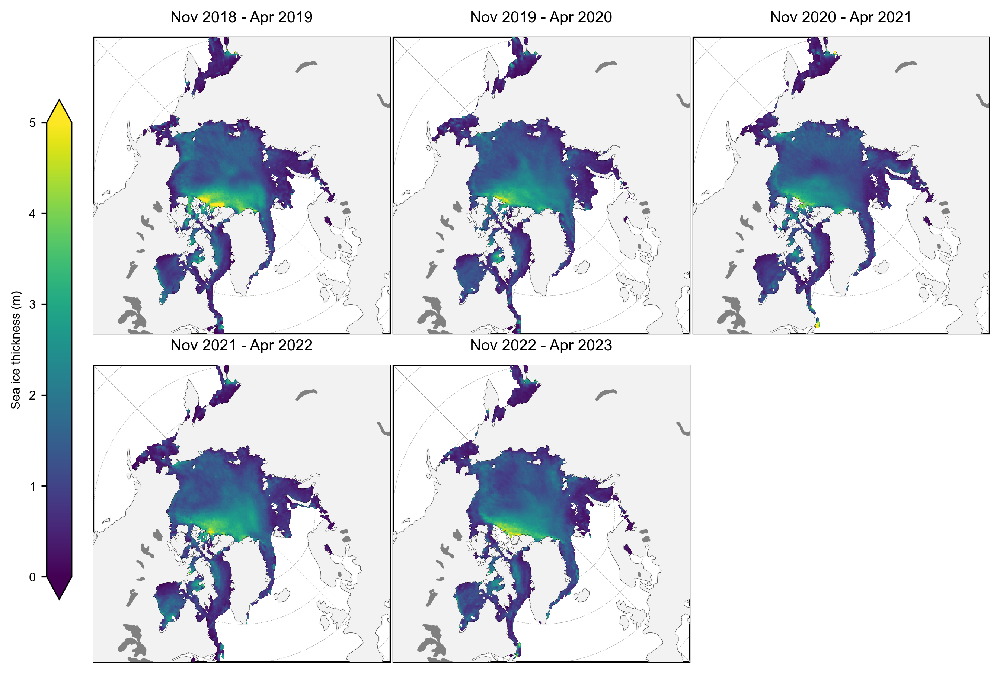

In [5]:
# Years over which to perform analysis (start year of that winter period)
years = [x for x in range(2018, 2022+1)]

thickness_winter_means = compute_gridcell_winter_means(IS2SITMOGR4_v3.ice_thickness_int, years=years)
staticArcticMaps(thickness_winter_means, dates=thickness_winter_means.time.values,title="", set_cbarlabel = "Sea ice thickness (m)", col_wrap=3, cmap="viridis", vmin=0, vmax=5, out_str='thickness_winter_2018_2023')

OK good, let's move on to some more analysis

### Set some analysis configuration options

In [6]:
# Set a region mask, e.g. to avoid including some of the more uncertain data in the peripheral seas
innerArctic = [1,2,3,4,5,6]
IS2SITMOGR4_v3_innerArctic = IS2SITMOGR4_v3.where(IS2SITMOGR4_v3.region_mask.isin(innerArctic))

# Drop Sep and October as coverage issues means they are hard to interpret
IS2SITMOGR4_v3_innerArctic = IS2SITMOGR4_v3_innerArctic.where(((IS2SITMOGR4_v3_innerArctic['time.month'] > 10)|(IS2SITMOGR4_v3_innerArctic['time.month'] < 5)), drop=True)

# Uncomment out to set an additional ice type mask too and change the save_label accordingly (0 = FYI, 1 = MYI)
#IS2SITMOGR4_all_innerArctic = IS2SITMOGR4_all_innerArctic.where(IS2SITMOGR4_all_innerArctic.ice_type==1)

save_label='Inner_Arctic'

## Seasonal time-series (updated interative plots)
As in the previous notebooks, we'll compute monthly means by averaging over all grid-cells within a given region to compare across the winter seasons for each variable. In the default setup I opt not so show October/November data here as they can be challenging to interpret (and are often misinterpreted) due to the incomplete sea ice coverage in those months. It also means all winters are equal (as data from our first winter season only starts in earnest in November 2018).

In this 2023 update I have experimented with using Holoviews to produce one consistent and interactive plot! Holoviews lacks the legacy development of matplotlib so has a surprising number of features missing and some random plotting issues (frame sizes can go awry quite easily for subplots, you can't save in vector format which seems insane etc). But they look pretty at least and benefit from being able to show the exact values if you hover over them which I see as the main benefit. 

If you play around with zooming in to the plots and want to go back to the original view, just hit the refresh icon at the top. 

See the end of this notebook for the original static/matplotlib plots, updated from the figures shown in Petty et al., (2023).

In [7]:
# Copy variables of interest. Using the interpolated variables of freeboard, snow depth and thickness
IS2SITMOGR4_v3_innerArctic_mean = IS2SITMOGR4_v3_innerArctic.mean(dim=['x', 'y'])[['freeboard_int', 'snow_depth_int', 
                                                                        'ice_thickness_int', 'snow_density', 'sea_ice_conc', 'ice_type']]

# Found the following analysis and holoviews plots helped to do this all in Pandas
IS2SITMOGR4_v3_innerArctic_mean_df = IS2SITMOGR4_v3_innerArctic_mean.to_dataframe()

# To plot data as a function of winter period I just create a new winter period column. Probably a fancier way of doing this
winters = ['winter 1','winter 1', 'winter 1', 'winter 1', 'winter 1', 'winter 1', 
           'winter 2', 'winter 2', 'winter 2', 'winter 2', 'winter 2', 'winter 2', 
           'winter 3', 'winter 3', 'winter 3', 'winter 3', 'winter 3', 'winter 3', 
           'winter 4', 'winter 4', 'winter 4', 'winter 4', 'winter 4', 'winter 4',  
           'winter 5', 'winter 5', 'winter 5', 'winter 5', 'winter 5', 'winter 5']

IS2SITMOGR4_v3_innerArctic_mean_df['winters']=winters
months=IS2SITMOGR4_v3_innerArctic_mean.time.dt.month

# Convert to months since sep to simply plot across winter. Probably a better way of doing this too!
months_since = [month-9 if month > 8 else month+3 for month in months]
IS2SITMOGR4_v3_innerArctic_mean_df['months_since_sep']=months_since

#IS2SITMOGR4_v3_innerArctic_mean_df.head()

In [8]:
# Reassign the time coordinate to be just the months (Nov, Dec, ect). This allows you to easily overlay the plots on top of each other, since they share an axis
IS2SITMOGR4_v3_innerArctic_mean_df["months"] = pd.to_datetime(IS2SITMOGR4_v3_innerArctic_mean_df.index.values).strftime("%b") 


In [9]:
line1 = IS2SITMOGR4_v3_innerArctic_mean_df.hvplot.line(x='months_since_sep', 
                                y='freeboard_int', by='winters').opts(xlabel='', ylabel='total freeboard (m)')
scatter1 = IS2SITMOGR4_v3_innerArctic_mean_df.hvplot.scatter(x='months_since_sep', 
                                                             y='freeboard_int', by='winters').opts(show_grid=True,yticks=[(0.2, '0.20'), (0.25, '0.25'), (0.3, '0.30'), (0.35, '0.35'), (0.4, '0.40')])
                                                                                                                     
line2 = IS2SITMOGR4_v3_innerArctic_mean_df.hvplot.line(x='months_since_sep', 
                                y='snow_depth_int', by='winters').opts(xlabel='', ylabel='snow depth (m)')
scatter2 = IS2SITMOGR4_v3_innerArctic_mean_df.hvplot.scatter(x='months_since_sep', 
                                                             y='snow_depth_int', by='winters').opts(show_grid=True,yticks=[ (0.09, '0.09'), (0.12, '0.12'), (0.15, '0.15'), (0.18, '0.18'), (0.21, '0.21'), (0.24, '0.24'), (0.27, '0.27')])

line3 = IS2SITMOGR4_v3_innerArctic_mean_df.hvplot.line(x='months_since_sep', 
                                y='ice_thickness_int', by='winters').opts(xlabel='', ylabel='ice thickness (m)')
scatter3 = IS2SITMOGR4_v3_innerArctic_mean_df.hvplot.scatter(x='months_since_sep', 
                                                             y='ice_thickness_int', by='winters').opts(show_grid=True,yticks=[ (1.0, '1.00'), (1.25, '1.25'), (1.5, '1.50'), (1.75, '1.75'), (2.0, '2.00')])

line4 = IS2SITMOGR4_v3_innerArctic_mean_df.hvplot.line(x='months_since_sep', 
                                y='snow_density', by='winters').opts(xlabel='', ylabel='snow density (kg/m^3)')
scatter4 = IS2SITMOGR4_v3_innerArctic_mean_df.hvplot.scatter(x='months_since_sep', 
                                                             y='snow_density', by='winters').opts(show_grid=True)

line5 = IS2SITMOGR4_v3_innerArctic_mean_df.hvplot.line(x='months_since_sep', 
                                y='ice_type', by='winters').opts(xlabel='', ylabel='ice type (0=FYI, 1=MYI)')
scatter5 = IS2SITMOGR4_v3_innerArctic_mean_df.hvplot.scatter(x='months_since_sep', 
                                                             y='ice_type', by='winters').opts(show_grid=True)

line6 = IS2SITMOGR4_v3_innerArctic_mean_df.hvplot.line(x='months_since_sep', 
                                y='sea_ice_conc', by='winters').opts(xlabel='Months', ylabel='sea ice concentration (fraction)')
scatter6 = IS2SITMOGR4_v3_innerArctic_mean_df.hvplot.scatter(x='months_since_sep', 
                                                             y='sea_ice_conc', by='winters').opts(show_grid=True,
                                                                                              xticks=[(0, 'Sep'), (1, 'Oct'), (2, 'Nov'), (3, 'Dec'), (4, 'Jan'), (5, 'Feb'), (6, 'Mar'), (7, 'Apr')])

plot_all = ((scatter1*line1) + (scatter2*line2) + (scatter3*line3) + (scatter4*line4) + (scatter5*line5) + (scatter6*line6)).cols(1)

plot_all.opts(hv.opts.Layout(shared_axes=True)) 

color_cycle = hv.Cycle(['#a6cee3', '#b2df8a', '#beaed4','#fdc086', 'black'])
plot_all.opts({'Scatter': {'color': color_cycle}})
plot_all.opts({'Curve': {'color': color_cycle}})
plot_all.opts({'Scatter': {'marker': 'x'}})
plot_all.opts({'Scatter': {'size': 15}})
plot_all.opts({'Scatter': {'xticks': [(0, ''), (1, ''), (2, ''), (3, ''), (4, ''), (5, ''), (6, ''), (7, '')]}})

# Frame width has an alignment issue - aligining the entire frame of each subplot not the plot window, so different sig figs in the y ticks messes things up. Can manually adjust if you really need to (already done for some)
frame_height=160
frame_width=800
plot_all.opts({'Scatter': {'frame_height': frame_height}})
plot_all.opts({'Curve': {'frame_height': frame_height}})

plot_all.opts(sync_legends=True, show_legends=5, legend_position=("bottom_right"))

display(plot_all)
#hv.save(plot_all, './figs/IS2SITMOGR4_winter_comparison_2023_hv.png')

:Layout
   .Overlay.I   :Overlay
      .NdOverlay.I  :NdOverlay   [winters]
         :Scatter   [months_since_sep]   (freeboard_int)
      .NdOverlay.II :NdOverlay   [winters]
         :Curve   [months_since_sep]   (freeboard_int)
   .Overlay.II  :Overlay
      .NdOverlay.I  :NdOverlay   [winters]
         :Scatter   [months_since_sep]   (snow_depth_int)
      .NdOverlay.II :NdOverlay   [winters]
         :Curve   [months_since_sep]   (snow_depth_int)
   .Overlay.III :Overlay
      .NdOverlay.I  :NdOverlay   [winters]
         :Scatter   [months_since_sep]   (ice_thickness_int)
      .NdOverlay.II :NdOverlay   [winters]
         :Curve   [months_since_sep]   (ice_thickness_int)
   .Overlay.IV  :Overlay
      .NdOverlay.I  :NdOverlay   [winters]
         :Scatter   [months_since_sep]   (snow_density)
      .NdOverlay.II :NdOverlay   [winters]
         :Curve   [months_since_sep]   (snow_density)
   .Overlay.V   :Overlay
      .NdOverlay.I  :NdOverlay   [winters]
         :Scatter   [months_since_sep]   (ice_type)
      .NdOverlay.II :NdOverlay   [winters]
         :Curve   [months_since_sep]   (ice_type)
   .Overlay.VI  :Overlay
      .NdOverlay.I  :NdOverlay   [winters]
         :Scatter   [months_since_sep]   (sea_ice_conc)
      .NdOverlay.II :NdOverlay   [winters]
         :Curve   [months_since_sep]   (sea_ice_conc)

## Version 2 to Version 3 IS2SITMOGR4 updates
Here we briefly discuss and show the differences between V2 and V3 IS2SITMOGR4 data. Please see the NSIDC User Guide and Known Issues document on the data landing page for more background: https://nsidc.org/data/is2sitmogr4. 

We will download the V2 data and undertake some basic comparisons across the entire mission period.

In [10]:
IS2SITMOGR4_v2 = read_IS2SITMOGR4(data_type='zarr-s3', zarr_path='s3://icesat-2-sea-ice-us-west-2/IS2SITMOGR4_V2/zarr/IS2SITMOGR4_V2_201811-202204.zarr/all/', persist=True) 


load zarr from S3 bucket
zarr_path: s3://icesat-2-sea-ice-us-west-2/IS2SITMOGR4_V2/zarr/IS2SITMOGR4_V2_201811-202204.zarr/all/


In [11]:
# Apply the same region mask and also drop September/October from the monthly mean analysis
IS2SITMOGR4_v2_innerArctic = IS2SITMOGR4_v2.where(IS2SITMOGR4_v2.region_mask.isin(innerArctic))
IS2SITMOGR4_v2_innerArctic = IS2SITMOGR4_v2_innerArctic.where(((IS2SITMOGR4_v2_innerArctic['time.month'] > 10)|(IS2SITMOGR4_v2_innerArctic['time.month'] < 5)), drop=True)

In [12]:
IS2SITMOGR4_v2_means = IS2SITMOGR4_v2_innerArctic.mean(dim=("x","y"), skipna=True, keep_attrs=True).resample(skipna=True, time='1M').asfreq()
IS2SITMOGR4_v3_means = IS2SITMOGR4_v3_innerArctic.mean(dim=("x","y"), skipna=True, keep_attrs=True).resample(skipna=True, time='1M').asfreq()

In [13]:
# Holoviews requires us to generate individual line plots then combine later
freeboard_plot_2 = IS2SITMOGR4_v2_means.freeboard_int.hvplot.line(grid=True, color='k') * IS2SITMOGR4_v2_means.freeboard_int.hvplot.scatter(marker='x', color='k', size=40).opts(ylabel="Total freeboard (m)", xlabel='')
freeboard_plot_3 = IS2SITMOGR4_v3_means.freeboard_int.hvplot.line(grid=True, color='b') * IS2SITMOGR4_v3_means.freeboard_int.hvplot.scatter(marker='x', color='b', size=40).opts({'Scatter': {'yticks': [ (0.2, '0.20'), (0.25, '0.25'), (0.3, '0.30'), (0.35, '0.35'), (0.4, '0.40')]}})

snow_depth_plot_2 = IS2SITMOGR4_v2_means.snow_depth_int.hvplot.line(grid=True, color='k') * IS2SITMOGR4_v2_means.snow_depth_int.hvplot.scatter(marker='x', color='k', size=40,).opts(ylabel="Snow depth (m)", xlabel='')
snow_depth_plot_3 = IS2SITMOGR4_v3_means.snow_depth_int.hvplot.line(grid=True, color='b') * IS2SITMOGR4_v3_means.snow_depth_int.hvplot.scatter(marker='x', color='b', size=40).opts({'Scatter': {'yticks': [ (0.12, '0.12'), (0.15, '0.15'), (0.18, '0.18'), (0.21, '0.21'), (0.24, '0.24'), (0.27, '0.27')]}}) 

thickness_plot_2 = IS2SITMOGR4_v2_means.ice_thickness_int.hvplot.line(grid=True, color='k') * IS2SITMOGR4_v2_means.ice_thickness_int.hvplot.scatter(marker='x', color='k', size=40, label='v2').opts(legend_position=("bottom_left"), ylabel="Sea ice thickness (m)") 
thickness_plot_3 = IS2SITMOGR4_v3_means.ice_thickness_int.hvplot.line(grid=True, color='b') * IS2SITMOGR4_v3_means.ice_thickness_int.hvplot.scatter(marker='x', color='b', size=40, label='v3').opts({'Scatter': {'yticks': [ (1.0, '1.00'), (1.25, '1.25'), (1.5, '1.50'), (1.75, '1.75'), (2.0, '2.00')]}}) 

plots_all = ((freeboard_plot_2*freeboard_plot_3) + (snow_depth_plot_2*snow_depth_plot_3) + (thickness_plot_2 * thickness_plot_3)).cols(1)

plots_all.opts(hv.opts.Layout(shared_axes=True)) 

# Frame width has an alignment issue
frame_height=160
plots_all.opts({'Scatter': {'frame_height': frame_height}})

plots_all.opts(title=" IS2SITMOGR4 Version 2 to 3 comparison", fontsize=10)
display(plots_all)

hv.save(plots_all, './figs/icesat-2_thickness_int_2018-2023_v2_v3.png', fmt='png')


:Layout
   .Overlay.I   :Overlay
      .Curve.I    :Curve   [time]   (sea ice freeboard interpolated)
      .Scatter.I  :Scatter   [time]   (sea ice freeboard interpolated)
      .Curve.II   :Curve   [time]   (total freeboard (interpolated))
      .Scatter.II :Scatter   [time]   (total freeboard (interpolated))
   .Overlay.II  :Overlay
      .Curve.I    :Curve   [time]   (snow depth interpolated)
      .Scatter.I  :Scatter   [time]   (snow depth interpolated)
      .Curve.II   :Curve   [time]   (snow depth (interpolated))
      .Scatter.II :Scatter   [time]   (snow depth (interpolated))
   .Overlay.III :Overlay
      .Curve.I    :Curve   [time]   (sea ice thickness interpolated)
      .Scatter.V2 :Scatter   [time]   (sea ice thickness interpolated)
      .Curve.II   :Curve   [time]   (sea ice thickness (interpolated))
      .Scatter.V3 :Scatter   [time]   (sea ice thickness (interpolated))

RuntimeError: To use bokeh.io image export functions you need selenium ('conda install selenium' or 'pip install selenium')

As you can see, not much in the way of differences! Let's try actually just plotting the differences now...

In [ ]:
freeboard_diff = IS2SITMOGR4_v3_means.freeboard_int-IS2SITMOGR4_v2_means.freeboard_int
# Overlay scatter plot to add markers
freeboard_plot_diff = freeboard_diff.hvplot.line(grid=True, color='k') * freeboard_diff.hvplot.scatter(marker='x', color='k', size=40).opts(ylabel="Total freeboard difference (m)", xlabel='') 

snow_depth_diff = IS2SITMOGR4_v3_means.snow_depth_int-IS2SITMOGR4_v2_means.snow_depth_int
snow_depth_plot_diff = snow_depth_diff.hvplot.line(grid=True, color='k') * snow_depth_diff.hvplot.scatter(marker='x', color='k', size=40).opts(ylabel="Snow depth difference (m)", xlabel='') 

ice_thickness_diff = IS2SITMOGR4_v3_means.ice_thickness_int-IS2SITMOGR4_v2_means.ice_thickness_int
ice_thickness_plot_diff = ice_thickness_diff.hvplot.line(grid=True, color='k') * ice_thickness_diff.hvplot.scatter(marker='x', color='k', size=40).opts(ylabel="ice thickness difference (m)") 

plots_all_diffs = (freeboard_plot_diff+snow_depth_plot_diff+ice_thickness_plot_diff).cols(1)

plots_all_diffs.opts(hv.opts.Layout(shared_axes=True)) 

plots_all_diffs.opts(title=" IS2SITMOGR4 version difference plot (2018-2023)", fontsize=10)
display(plots_all_diffs)

hv.save(plots_all_diffs, './figs/icesat-2_thickness_int_2018-2023_v2_v3_difference.png', fmt='png')


:Layout
   .Overlay.I   :Overlay
      .Curve.I   :Curve   [time]   (freeboard_int)
      .Scatter.I :Scatter   [time]   (freeboard_int)
   .Overlay.II  :Overlay
      .Curve.I   :Curve   [time]   (snow_depth_int)
      .Scatter.I :Scatter   [time]   (snow_depth_int)
   .Overlay.III :Overlay
      .Curve.I   :Curve   [time]   (ice_thickness_int)
      .Scatter.I :Scatter   [time]   (ice_thickness_int)

OK good, all differences are less than 1 cm including the derived thickness! This was largely expected as there were no major differences in the underlying freeboards or the freeboard to thickness processing chain.

### New variables included in Version 3 data

In this Version 3 dataset we included additional variables of ice thickness calculated using different input assumptions:
 - Modified Warren snow loading climatology (Warren et al., 1999, calculated as in Tilling et al., 2018).
 - SnowModel-LG snow loading (Liston et al., 2021). 
 - A new ice density parameterization (an empirical function of ice freeboard, derived by subtracting redistributed snow depth from the total ATL10 freeboard) from Jutila et al., (2022).
 
These were included to enable comparisons of sea ice thickness with those derived in other studies and to briefly explore the impact of snow loading and ice density assumptions on sea ice thickness estimates. The different snow loading and ice density assumptions are included in the updated dataset as well as the derived thicknesses. Note that this analysis has not been peer reviewed and is provided here for transparency and to spur further research efforts and discusison with the sea ice renmote sensing community. 

We still regard our thickness estimates derived using NESOSIM v1.1 snow loading as our primary focus and recommended variable for most end-users as these data have been calibrated against recent Operation IceBridge snow depths (Petty et al., 2023) and continue to be maintained and developed towards continued sea ice thickness retrievals.

A few notes:
 - The SnowModel-LG data is currently only available through to summer 2021 so are only used in our processing up to April 2021. 
 - For the Warren snow loading we follow the approach of Tilling et al., (2018) and just take regional inner Arctic monthly means of snow depth and density (snow depth then halved over first-year ice). 
 - The ice density parameterization presented in Jutila et al., (2022) is a function of the local ice freeboard (total freeboard minus snow depth) which we calculate at the raw ATL10 segment level. Differences are thus expected to be much higher in the along-track thickness data (Version 2 of the IS2SITDAT4 along-track thickness data will be available soon) compared to these gridded differences.
 - These new fields (input assumptions and the derived thicknesses) have not been interpolated/smoothed so we show only the raw gridded values for all estimates here (so the NESOSIM results will differ slightly from the above).

Finally, to provide added context we also show results from the recent UBRIS all-season CryoSat-2 thickness product (Landy et al., 2023) which uses SnowModel-LG data as their input snow loading.

In [ ]:
# Read in the previously wrangled CryoSat-2 data. 
# Feel free to play with other CS-2 datasets here too!
book_ds = read_book_data(CS2=True)
cs2_var="UBRIS"
cs2 = book_ds["cs2_sea_ice_thickness_"+cs2_var]

In [ ]:
# Let's make sure the CS-2 data is only used in the monthly averages where we also have IS-2 thickness data (a common mask)
# Should be able to use apply or ufunc for this ideally, working on it..
# The UBRIS data is only publicly available through to April 2020 right now.
start_date = "Nov 2018"
end_date = "Apr 2020"
date_range = pd.date_range(start=start_date, end=end_date, freq='MS') # MS indicates a time frequency of start of the month
date_range = date_range[((date_range.month <5) | (date_range.month > 10))]
cs2_data_mask_months=[]
for date in date_range:
    #print(date)
    masked_month = cs2.sel(time=date).copy(deep=True)
    # Mask where ICESat-2 data is missing
    masked_month = masked_month.where(IS2SITMOGR4_v3_innerArctic.ice_thickness_int.sel(time=date)>0.0) 
    cs2_data_mask_months.append(masked_month)

cs2_data_mask = xr.concat(cs2_data_mask_months, "time")
cs2_data_mask_mean=cs2_data_mask.mean(dim=("x","y"), skipna=True, keep_attrs=True).resample(skipna=True, time='1M').asfreq().to_dataframe()

In [ ]:
snow_depth_plot_1 = IS2SITMOGR4_v3_means.snow_depth.hvplot.line(grid=True, color='k') * IS2SITMOGR4_v3_means.snow_depth.hvplot.scatter(marker='x', color='k', size=40,).opts(xlabel="", ylabel="Snow depth (m)") # Overlay scatter plot to add markers
snow_depth_plot_2 = IS2SITMOGR4_v3_means.snow_depth_sm.hvplot.line(grid=True, color='b') * IS2SITMOGR4_v3_means.snow_depth_sm.hvplot.scatter(marker='x', color='b', size=40)
snow_depth_plot_3 = IS2SITMOGR4_v3_means.snow_depth_mw99.hvplot.line(grid=True, color='r') * IS2SITMOGR4_v3_means.snow_depth_mw99.hvplot.scatter(marker='x', color='r', size=40)

thickness_plot_1 = IS2SITMOGR4_v3_means.ice_thickness.hvplot.line(grid=True, color='k') * IS2SITMOGR4_v3_means.ice_thickness.hvplot.scatter(marker='x', color='k', size=40, label='NSIM').opts(ylabel="Sea ice thickness (m)", legend_position=("right")) # Overlay scatter plot to add markers
thickness_plot_2 = IS2SITMOGR4_v3_means.ice_thickness_sm.hvplot.line(grid=True, color='b') * IS2SITMOGR4_v3_means.ice_thickness_sm.hvplot.scatter(marker='x', color='b', size=40, label='SM')
thickness_plot_3 = IS2SITMOGR4_v3_means.ice_thickness_mw99.hvplot.line(grid=True, color='r') * IS2SITMOGR4_v3_means.ice_thickness_mw99.hvplot.scatter(marker='x', color='r', size=40, label='mW99')
thickness_plot_4 = IS2SITMOGR4_v3_means.ice_thickness_j22.hvplot.line(grid=True, color='m') * IS2SITMOGR4_v3_means.ice_thickness_j22.hvplot.scatter(marker='x', color='m', size=40, label='J22')
thickness_plot_5 = cs2_data_mask_mean.hvplot.line(grid=True, color='y') * cs2_data_mask_mean.hvplot.scatter(marker='x', color='y', size=40, label='CS2-'+cs2_var)

plots_all_vars = ((snow_depth_plot_1*snow_depth_plot_2*snow_depth_plot_3) + (thickness_plot_1*thickness_plot_2 * thickness_plot_3*thickness_plot_4*thickness_plot_5)).cols(1)

plots_all_vars.opts(hv.opts.Layout(shared_axes=True)) 

plots_all_vars.opts(title=" IS2SITMOGR4 input assumption comparisons", fontsize=10)
display(plots_all_vars)

hv.save(plots_all_vars, './figs/icesat-2_thickness_int_2018-2023_new_vars.png', fmt='png')


:Layout
   .Overlay.I  :Overlay
      .Curve.I     :Curve   [time]   (snow_depth)
      .Scatter.I   :Scatter   [time]   (snow_depth)
      .Curve.II    :Curve   [time]   (snow_depth_sm)
      .Scatter.II  :Scatter   [time]   (snow_depth_sm)
      .Curve.III   :Curve   [time]   (snow_depth_mw99)
      .Scatter.III :Scatter   [time]   (snow_depth_mw99)
   .Overlay.II :Overlay
      .Curve.I                        :Curve   [time]   (ice_thickness)
      .Scatter.NSIM                   :Scatter   [time]   (ice_thickness)
      .Curve.II                       :Curve   [time]   (ice_thickness_sm)
      .Scatter.SM                     :Scatter   [time]   (ice_thickness_sm)
      .Curve.III                      :Curve   [time]   (ice_thickness_mw99)
      .Scatter.MW99                   :Scatter   [time]   (ice_thickness_mw99)
      .Curve.IV                       :Curve   [time]   (ice_thickness_j22)
      .Scatter.J22                    :Scatter   [time]   (ice_thickness_j22)
      .Curve.V                        :Curve   [time]   (cs2_sea_ice_thickness_UBRIS)
      .Scatter.CS2_hyphen_minus_UBRIS :Scatter   [time]   (cs2_sea_ice_thickness_UBRIS)

These results are quite interesting! My quick thoughts:   

* We discuss below our estimates of sea ice thickness uncertainty and how my thoughts on this have changed, which integrates some of these ideas of systematic biases based on uncertainty in input asusmptions. This analysis instead presents raw differences to provide a more intuitive sense of how input assumption choices impact the derived thicknesses. Through on-going validation we hope to better constrain which is most accurate or 'plausible'.
* The sensitivity to the choice of snow loading is high! Up to 50 cm in some months which seems to contribute up to 50% of the total uncertainty. See discussion below on my updated thickness uncertainty values.    
* I've long been a bit concerned by the fact NESOSIM snow depths keep increasing at a steady rate in April, interesting that the impact of that is that the thickness does level off more than the other products.
* The UBRIS/Landy data uses SnowModel-LG snow depths but can still have quite large differences in thickness even compared to my runs using the same SnowModel-LG data. SNow loading biases have a contrasting impact on thickness depending on whether you measure ice (radar) or total (laser) freeboard.  
* Lot's more to unpack here! 


### Thickness uncertainty changes

The final Version3 changes relate to our treatment of uncertainties. We still use the propagation of uncertainties approach but have changed some of our underlying assumptions. These have been summarized in the updated User Guide found on the NSIDC portal: https://nsidc.org/data/is2sitmogr4/. One of the big changes wqas prescribing the systematic snow uncertainty as 8 cm (or the total freeboard, whatever is highest) based on our comparisons of NESOSIM against OIB (Petty et al., 2023), instead of basing this on the spread in snow loading input assumptions we apply. THe latter was considered implausibly low in many regions as there was low confidence that our input models spanned the full distribution of plausiable estimates. A comparison of the mean Arctic thickness uncertainties is shown below

In [ ]:

thickness_unc_plot_1 = IS2SITMOGR4_v2_means.ice_thickness_unc.hvplot.line(grid=True, color='k') * IS2SITMOGR4_v2_means.ice_thickness_unc.hvplot.scatter(marker='x', color='k', size=40, label='v2').opts(ylabel="Sea ice thickness uncertainty (m)", legend_position=("right")) # Overlay scatter plot to add markers
thickness_unc_plot_2 = IS2SITMOGR4_v3_means.ice_thickness_unc.hvplot.line(grid=True, color='b') * IS2SITMOGR4_v3_means.ice_thickness_unc.hvplot.scatter(marker='x', color='b', size=40, label='v3')

plots_unc = (thickness_unc_plot_1*thickness_unc_plot_2) 

plots_unc.opts(title="IS2SITMOGR4 V2 to V3 total thickness uncertainty differences", fontsize=10)
display(plots_unc)
hv.save(plots_unc, './figs/icesat-2_thickness_unc_v2_v3.png', fmt='png')


:Overlay
   .Curve.I    :Curve   [time]   (ice_thickness_unc)
   .Scatter.V2 :Scatter   [time]   (ice_thickness_unc)
   .Curve.II   :Curve   [time]   (ice_thickness_unc)
   .Scatter.V3 :Scatter   [time]   (ice_thickness_unc)

As you can see, our new thickness uncertainties are considerably higher in Version 3! 

Work is ongoing to assess these total thickness uncertainties in relation to our validation efforts, e.g. comparisons with the BGEP ULS ice draft measurements: https://www.icesat-2-sea-ice-state.info/content/4_comparisons_with_BGEP.html

In [ ]:
thickness_unc_conc_total = IS2SITMOGR4_v3_means.ice_thickness_unc.hvplot.line(grid=True, color='k') * IS2SITMOGR4_v3_means.ice_thickness_unc.hvplot.scatter(marker='x', color='k', size=40, label='total unc')
thickness_unc_conc_freeboard = IS2SITMOGR4_v3_means.ice_thickness_unc_freeboard.hvplot.line(grid=True, color='b') * IS2SITMOGR4_v3_means.ice_thickness_unc_freeboard.hvplot.scatter(marker='x', color='b', size=40, label='freeboard cont')
thickness_unc_conc_snow_depth = IS2SITMOGR4_v3_means.ice_thickness_unc_snow_depth.hvplot.line(grid=True, color='r') * IS2SITMOGR4_v3_means.ice_thickness_unc_snow_depth.hvplot.scatter(marker='x', color='r', size=40, label='snow depth cont')
thickness_unc_conc_snow_density = IS2SITMOGR4_v3_means.ice_thickness_unc_snow_density.hvplot.line(grid=True, color='m') * IS2SITMOGR4_v3_means.ice_thickness_unc_snow_density.hvplot.scatter(marker='x', color='m', size=40, label='snow density cont')
thickness_unc_conc_ice_density = IS2SITMOGR4_v3_means.ice_thickness_unc_ice_density.hvplot.line(grid=True, color='y') * IS2SITMOGR4_v3_means.ice_thickness_unc_ice_density.hvplot.scatter(marker='x', color='y', size=40, label='ice density cont')

plots_unc = (thickness_unc_conc_total*thickness_unc_conc_freeboard*thickness_unc_conc_snow_depth*thickness_unc_conc_snow_density*thickness_unc_conc_ice_density) 

plots_unc.opts(title="IS2SITMOGR4 V3 uncertainty contributions", fontsize=10)
display(plots_unc)
hv.save(plots_unc, './figs/icesat-2_thickness_unc_conts.png', fmt='png')


:Overlay
   .Curve.I                   :Curve   [time]   (ice_thickness_unc)
   .Scatter.Total_unc         :Scatter   [time]   (ice_thickness_unc)
   .Curve.II                  :Curve   [time]   (ice_thickness_unc_freeboard)
   .Scatter.Freeboard_cont    :Scatter   [time]   (ice_thickness_unc_freeboard)
   .Curve.III                 :Curve   [time]   (ice_thickness_unc_snow_depth)
   .Scatter.Snow_depth_cont   :Scatter   [time]   (ice_thickness_unc_snow_depth)
   .Curve.IV                  :Curve   [time]   (ice_thickness_unc_snow_density)
   .Scatter.Snow_density_cont :Scatter   [time]   (ice_thickness_unc_snow_density)
   .Curve.V                   :Curve   [time]   (ice_thickness_unc_ice_density)
   .Scatter.Ice_density_cont  :Scatter   [time]   (ice_thickness_unc_ice_density)

Some notes on these new variables:
 - All uncertainties are provided as standard deviations, they need to be squared/converted to variance to make the contributions add up to the total!
 - As you can see, the snow depth uncertainty is dominating our total uncertainty! It may be that this is now being prescribed too high (the OIB validation is in spring when snow depths are highest) but I decided to keep this conservative until we get better information. 
 - the constant (~10 cm) freeboard uncertainty contribution is because we prescribe the underlying systematic freeboard uncertainty at 1 cm and this is just a function of fixed seawater and ice densities.
 - A big issue - how to actually average these uncertainties is not-trivial. The 25 km grid-scale is hard to interpret. Some providers of sea ice thickness data assume the errors to be uncorrelated/random at these larger-scales (so would reduce with N), but this is hard to clearly demonstrate. In general the uncertainties should be reated with caution!


## Updated Petty et al., (2023) plots including winter 2022-2023

Finally, we also produce the plots as in previous notebooks and the plots presented in Petty et al., (2023) for consistency.

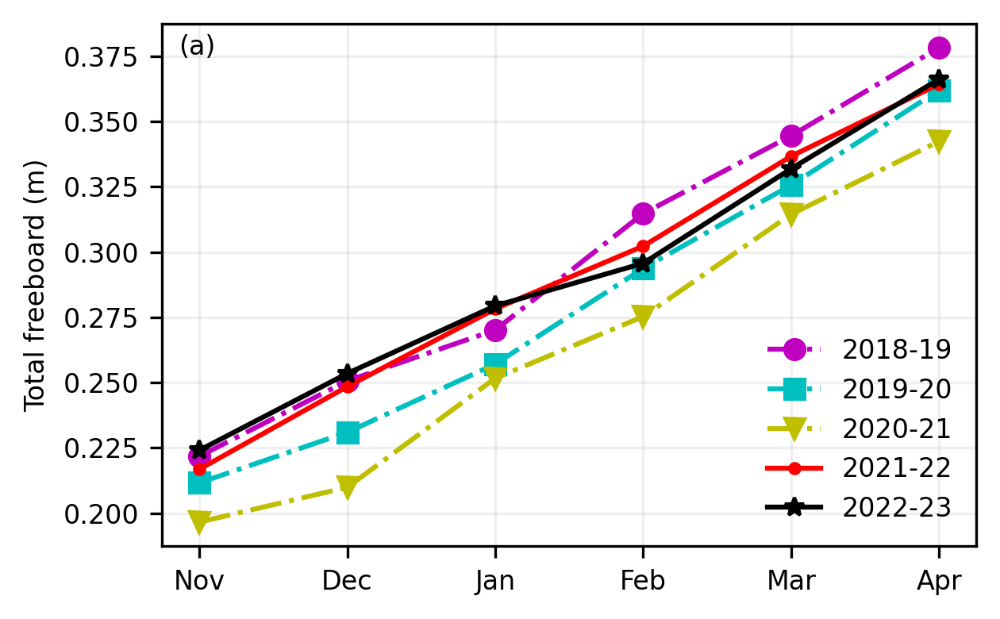

In [ ]:
static_winter_comparison_lineplot(IS2SITMOGR4_v3_innerArctic.freeboard, years=years, start_month="Sep", 
                                  figsize=(4.3,2.7), annotation='(a)', set_ylabel=r'Total freeboard (m)', 
                                  fmts = ['mo-.','cs-.','yv-.','r.-','k*-','gD--','b-.'],
                                  save_label=save_label, loc_pos=4, legend=True)

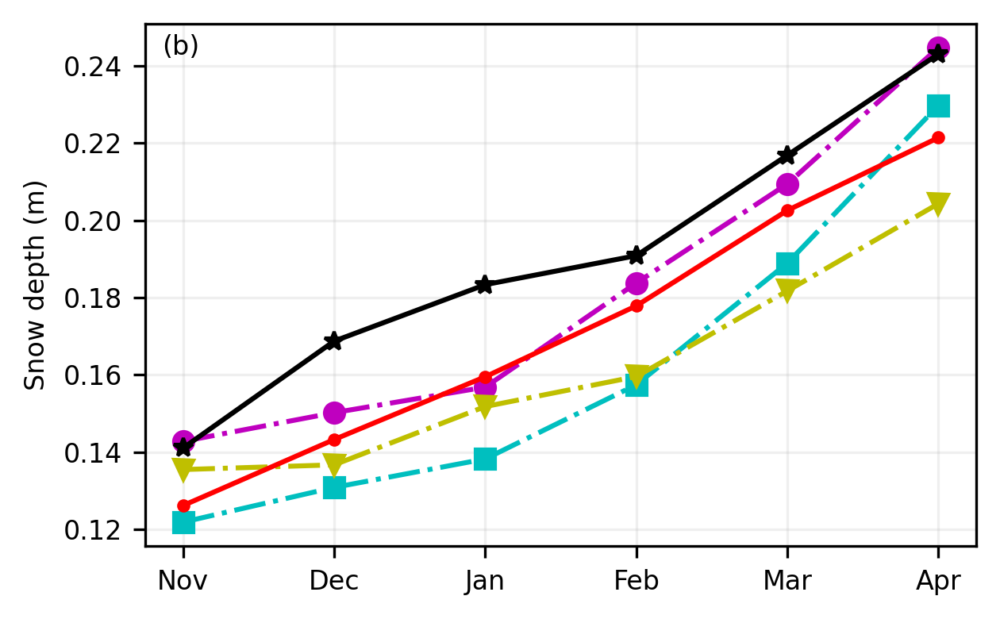

In [ ]:
static_winter_comparison_lineplot(IS2SITMOGR4_v3_innerArctic.snow_depth, years=years, start_month="Sep", 
                                  figsize=(4.3,2.7), annotation='(b)',set_ylabel='Snow depth (m)', 
                                  fmts = ['mo-.','cs-.','yv-.','r.-','k*-','gD--','b-.'],
                                  save_label=save_label, legend=False)

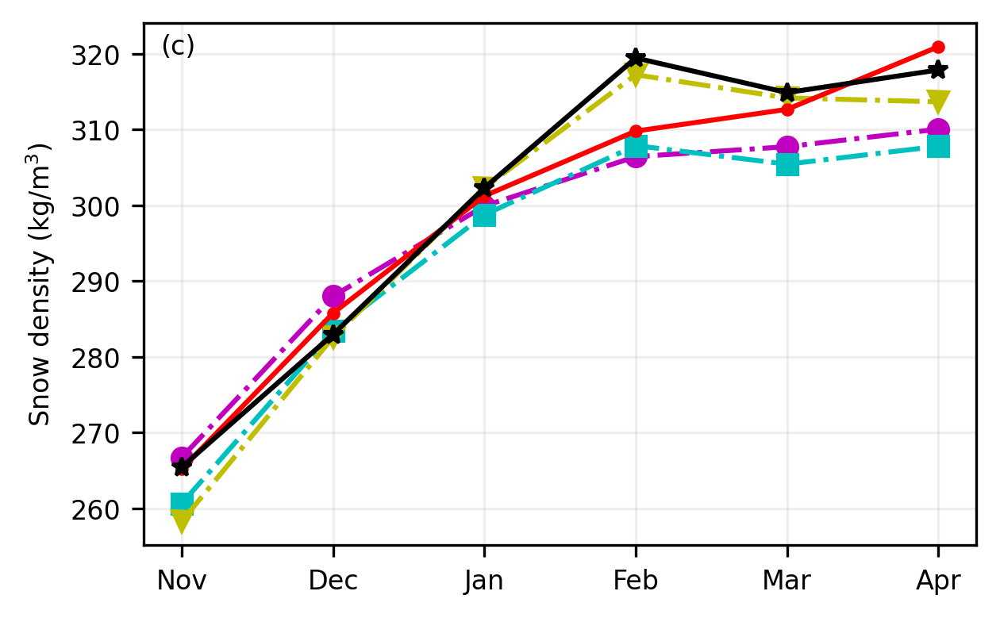

In [ ]:
static_winter_comparison_lineplot(IS2SITMOGR4_v3_innerArctic.snow_density, years=years, start_month="Sep", 
                                  figsize=(4.3,2.7), annotation='(c)',set_ylabel=r'Snow density (kg/m$^3$)', 
                                  fmts = ['mo-.','cs-.','yv-.','r.-','k*-','gD--','b-.'],
                                  save_label=save_label, legend=False)

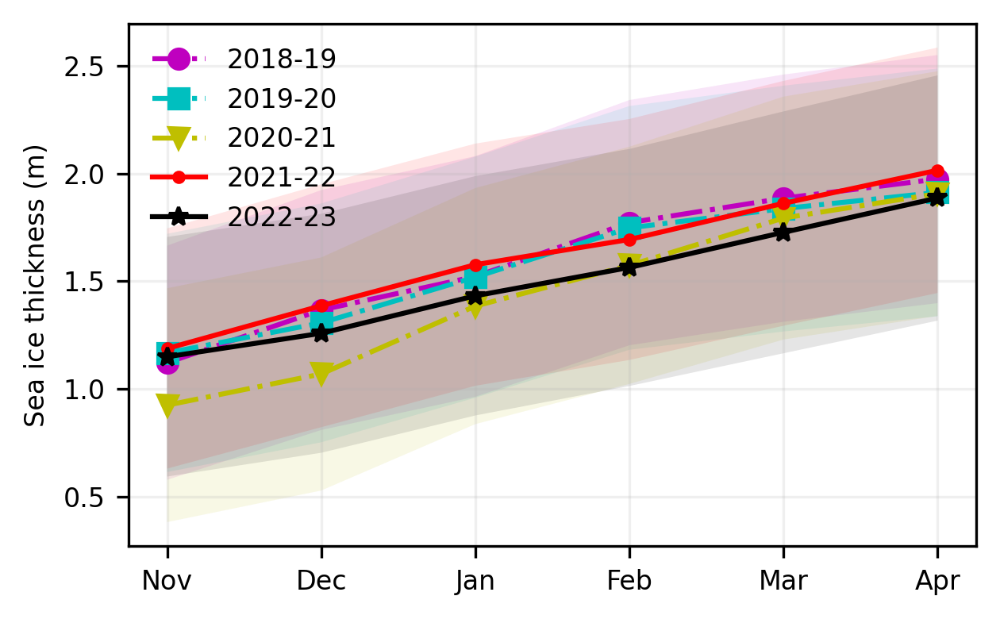

In [ ]:
static_winter_comparison_lineplot(IS2SITMOGR4_v3_innerArctic.ice_thickness, 
                                  da_unc = IS2SITMOGR4_v3_innerArctic.ice_thickness_unc, 
                                  years=years, start_month="Sep", figsize=(4.3,2.7), 
                                  fmts = ['mo-.','cs-.','yv-.','r.-','k*-'],
                                  set_ylabel='Sea ice thickness (m)', save_label=save_label, annotation='', legend=True)

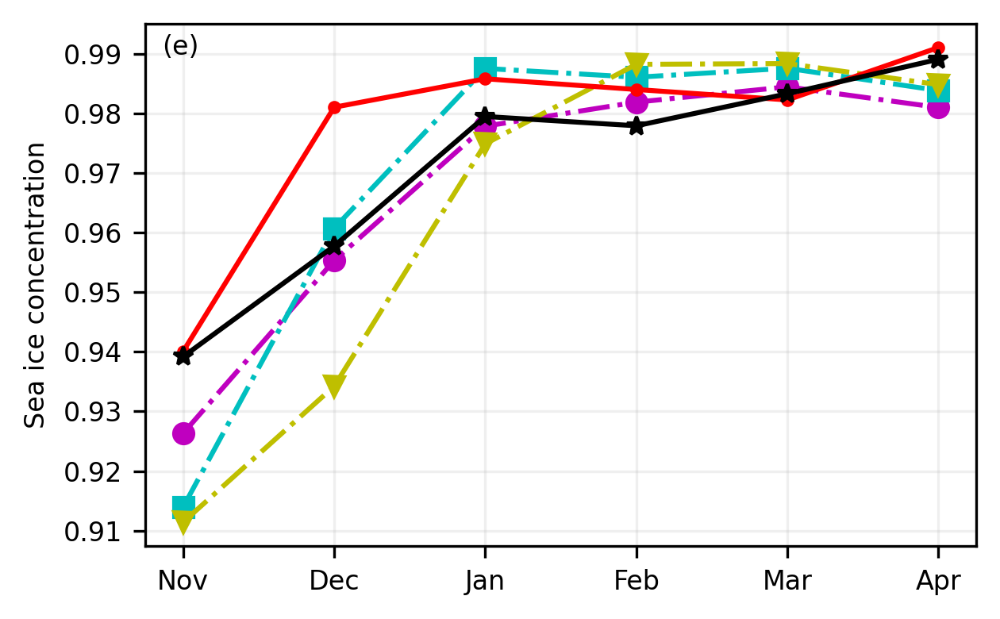

In [ ]:
static_winter_comparison_lineplot(IS2SITMOGR4_v3_innerArctic.sea_ice_conc, years=years, start_month="Sep", figsize=(4.3,2.7), annotation='(e)', 
                                  fmts = ['mo-.','cs-.','yv-.','r.-','k*-','gD--','b-.'],
                                  set_ylabel='Sea ice concentration', save_label=save_label, legend=False)

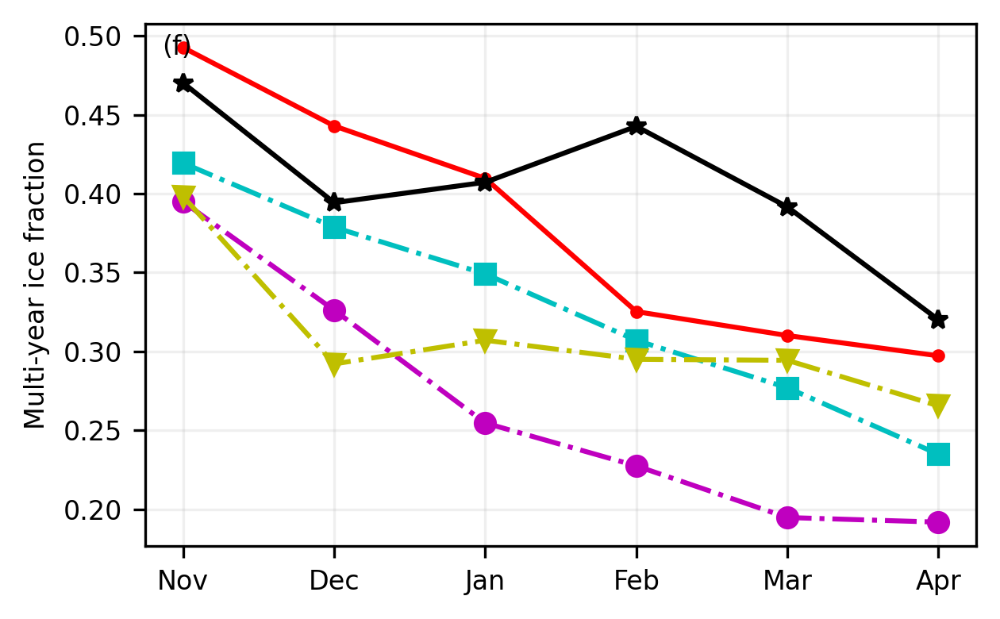

In [ ]:
static_winter_comparison_lineplot(IS2SITMOGR4_v3_innerArctic.ice_type, years=years, start_month="Sep", 
                                  figsize=(4.3,2.7), annotation='(f)',set_ylabel='Multi-year ice fraction', 
                                  fmts = ['mo-.','cs-.','yv-.','r.-','k*-','gD--','b-.'],
                                  save_label=save_label, legend=False)

### Winter mean Arctic maps (static)
Compute and map the winter mean sea ice conditions across the years of analysis chosen


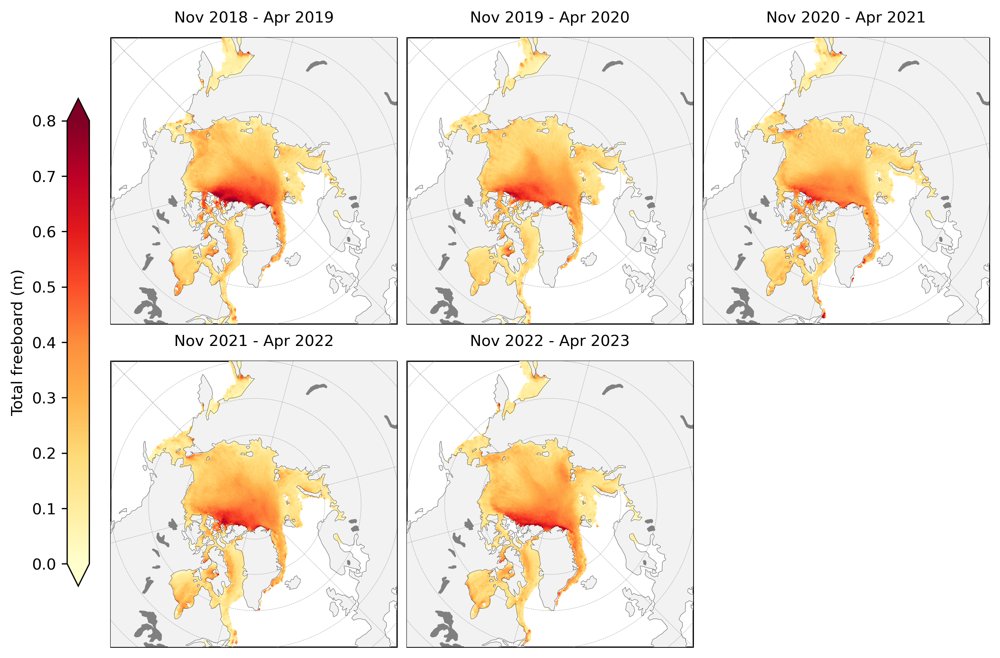

In [ ]:
freeboard_winter_means = compute_gridcell_winter_means(IS2SITMOGR4_v3.freeboard_int, years=years)
staticArcticMaps(freeboard_winter_means, dates=freeboard_winter_means.time.values, set_cbarlabel = "Total freeboard (m)", cmap="YlOrRd", col_wrap=3, vmin=0, vmax=0.8, out_str='freeboard_winter_2018_2023')


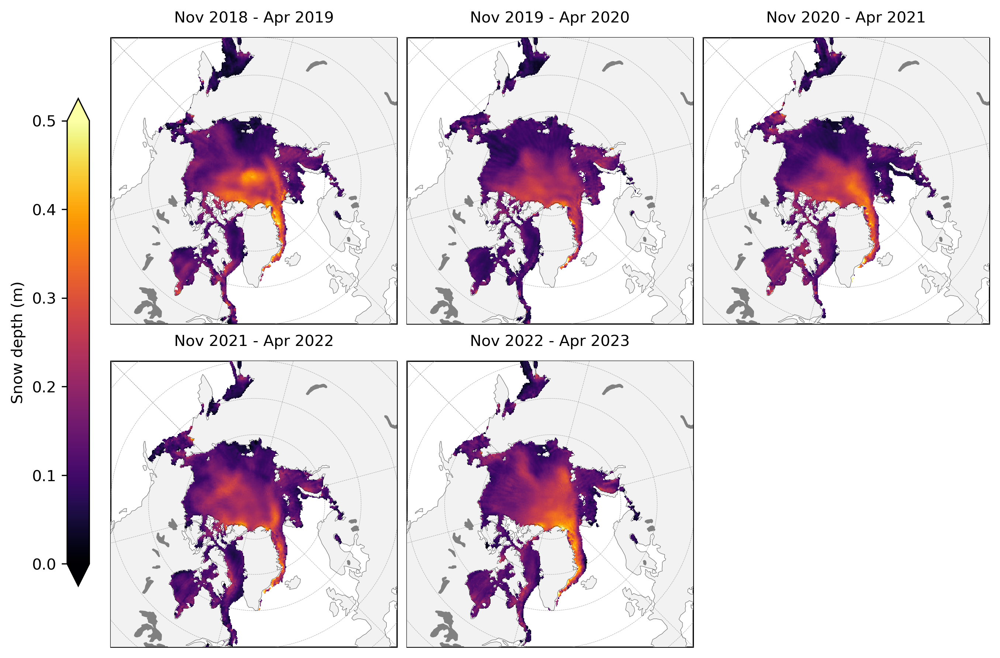

In [ ]:
snow_depth_winter_means = compute_gridcell_winter_means(IS2SITMOGR4_v3.snow_depth_int, years=years)
staticArcticMaps(snow_depth_winter_means, dates=snow_depth_winter_means.time.values,set_cbarlabel = "Snow depth (m)", cmap="inferno", col_wrap=3, vmin=0, vmax=0.5, out_str='snowdepth_winter_2018_2023')


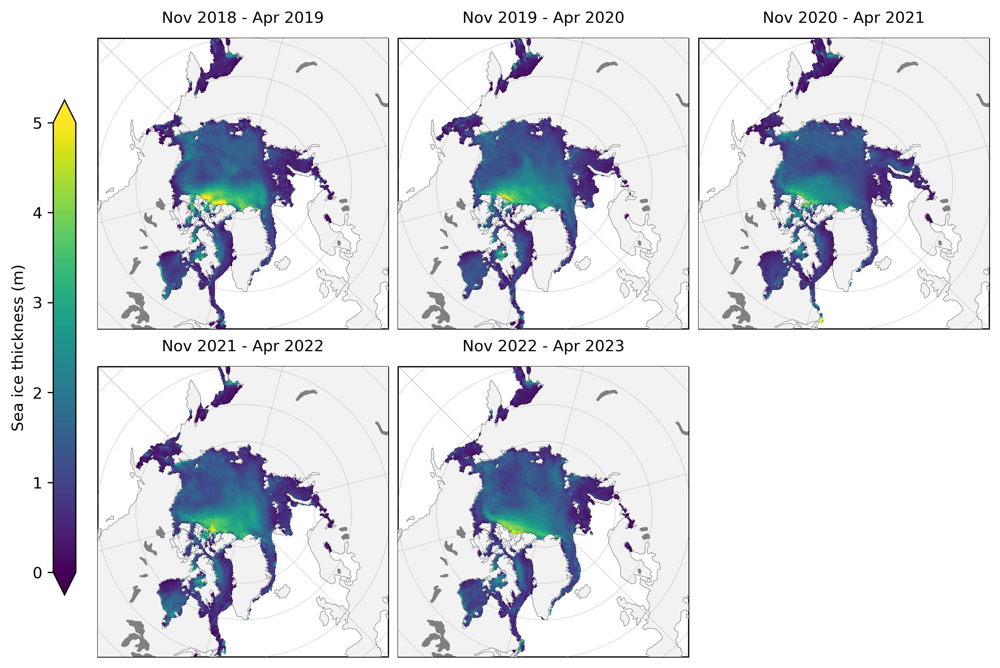

In [ ]:
thickness_winter_means = compute_gridcell_winter_means(IS2SITMOGR4_v3.ice_thickness_int, years=years)
staticArcticMaps(thickness_winter_means, dates=thickness_winter_means.time.values,title="", set_cbarlabel = "Sea ice thickness (m)", col_wrap=3, cmap="viridis", vmin=0, vmax=5, out_str='thickness_winter_2018_2023')


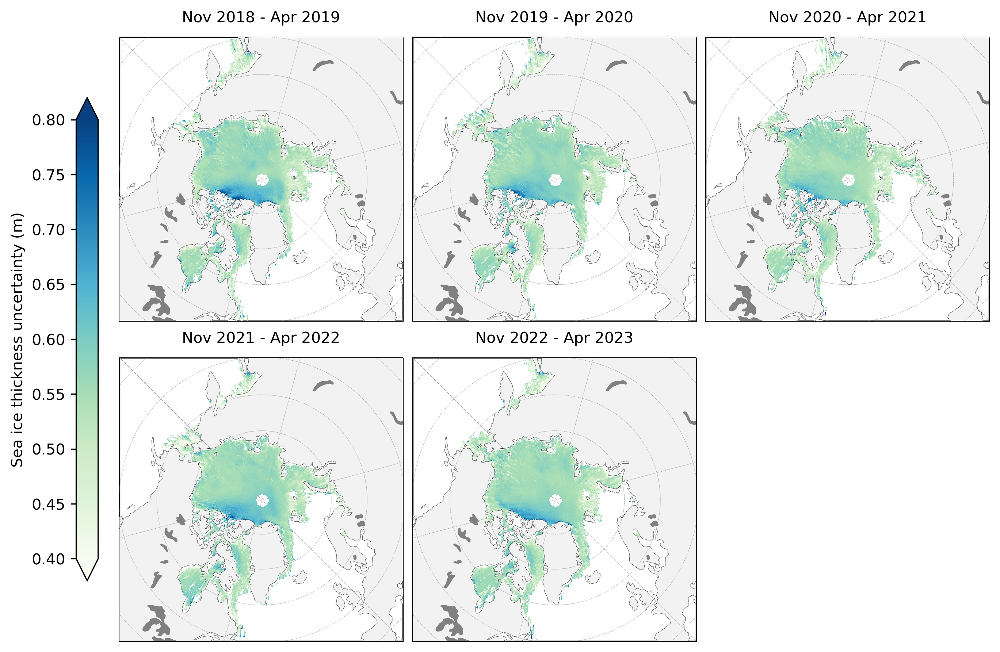

In [ ]:
thickness_unc_winter_means = compute_gridcell_winter_means(IS2SITMOGR4_v3.ice_thickness_unc, years=years)
staticArcticMaps(thickness_unc_winter_means, dates=thickness_unc_winter_means.time.values,title="", set_cbarlabel = "Sea ice thickness uncertainty (m)", col_wrap=3, cmap="GnBu", vmin=0.4, vmax=0.8, out_str='thickness_unc_winter_2018_2023')


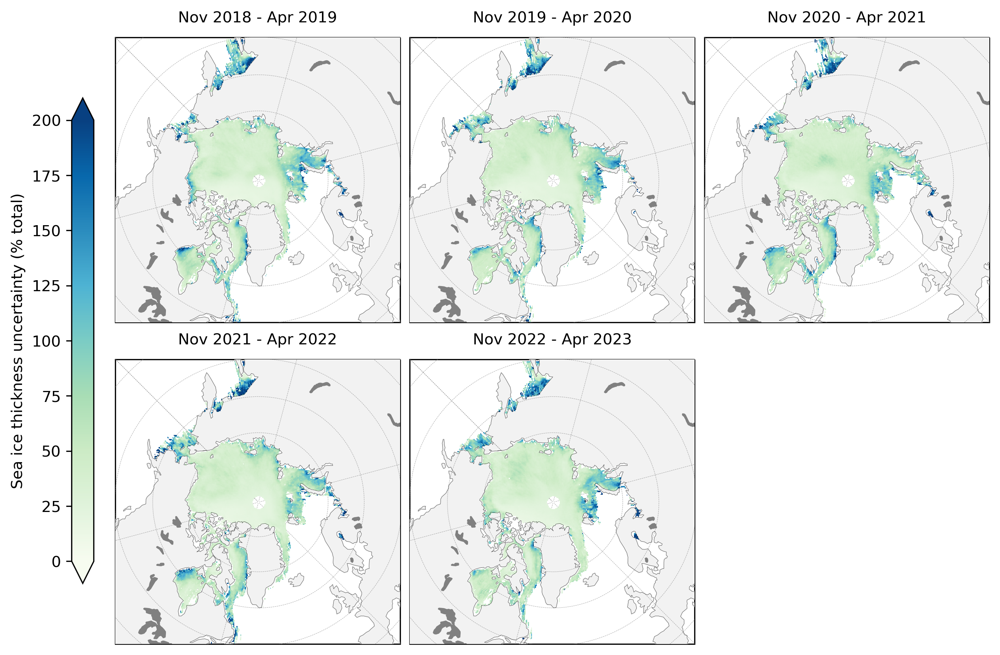

In [ ]:

staticArcticMaps(100*thickness_unc_winter_means/thickness_winter_means, dates=thickness_unc_winter_means.time.values,title="", set_cbarlabel = "Sea ice thickness uncertainty (% total)", col_wrap=3, cmap="GnBu", vmin=0, vmax=200, out_str='thickness_unc_winter_2018_2023')


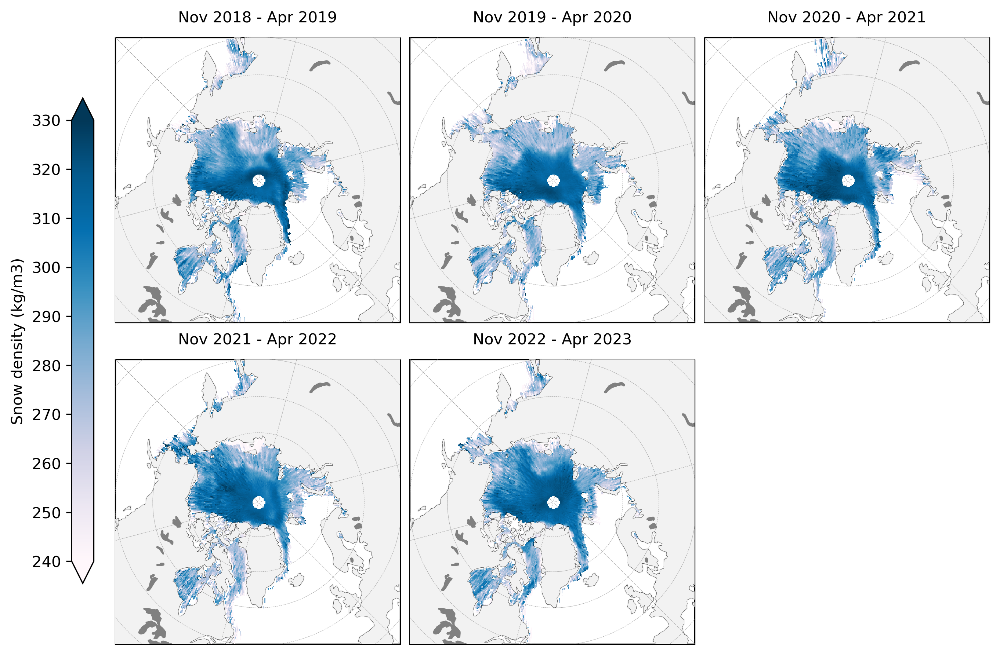

In [ ]:
snow_density_winter_means = compute_gridcell_winter_means(IS2SITMOGR4_v3.snow_density, years=years)
staticArcticMaps(snow_density_winter_means, dates=snow_density_winter_means.time.values,set_cbarlabel = "Snow density (kg/m3)", cmap="PuBu", col_wrap=3, vmin=240, vmax=330, out_str='snowdensity_winter_2018_2023')


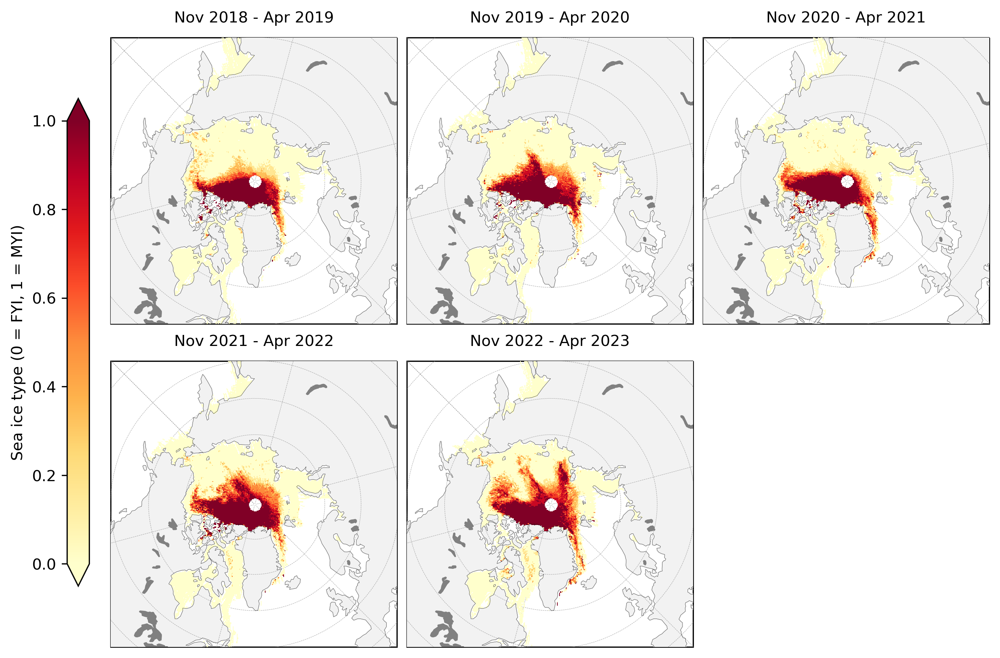

In [ ]:
ice_type_winter_means = compute_gridcell_winter_means(IS2SITMOGR4_v3.ice_type, years=years)
staticArcticMaps(ice_type_winter_means, dates=ice_type_winter_means.time.values, set_cbarlabel = "Sea ice type (0 = FYI, 1 = MYI)", col_wrap=3, cmap="YlOrRd", vmin=0, vmax=1, out_str='icetype_winter_2018_2023')


### Winter anomaly plots
Compute and map (static) winter anomaly maps (relative to the mean across the three winters by default) for given variables across the four winters

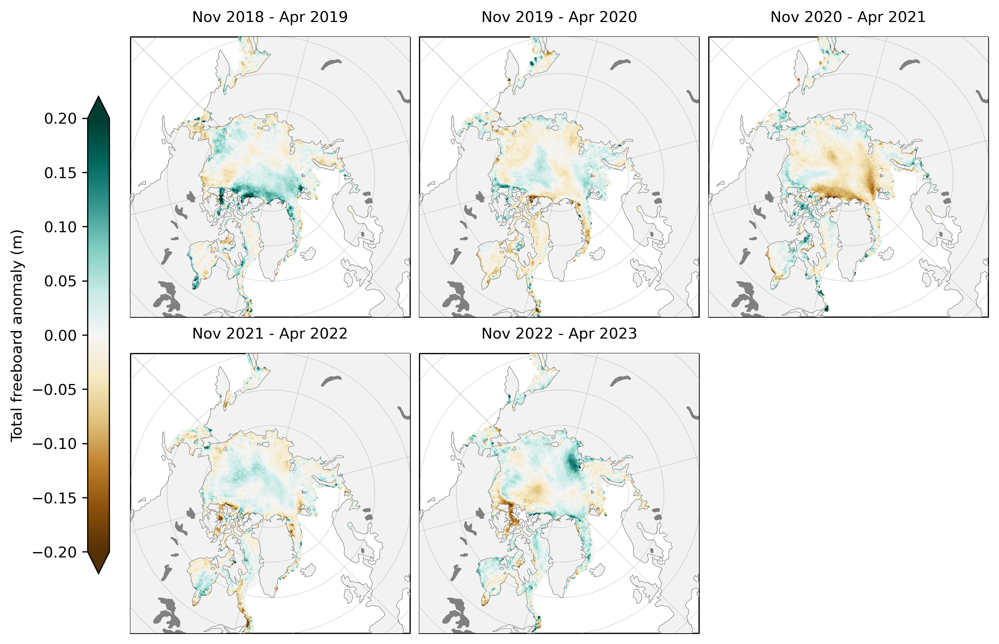

In [ ]:
freeboard_winter_means = compute_gridcell_winter_means(IS2SITMOGR4_v3.freeboard_int, years=years)
staticArcticMaps(freeboard_winter_means-freeboard_winter_means.mean(axis=0), dates=freeboard_winter_means.time.values,title="", col_wrap=3, set_cbarlabel = "Total freeboard anomaly (m)", cmap="BrBG", vmin=-0.2, vmax=0.2, out_str='freeboard_winter_anomaly_2018_2023')


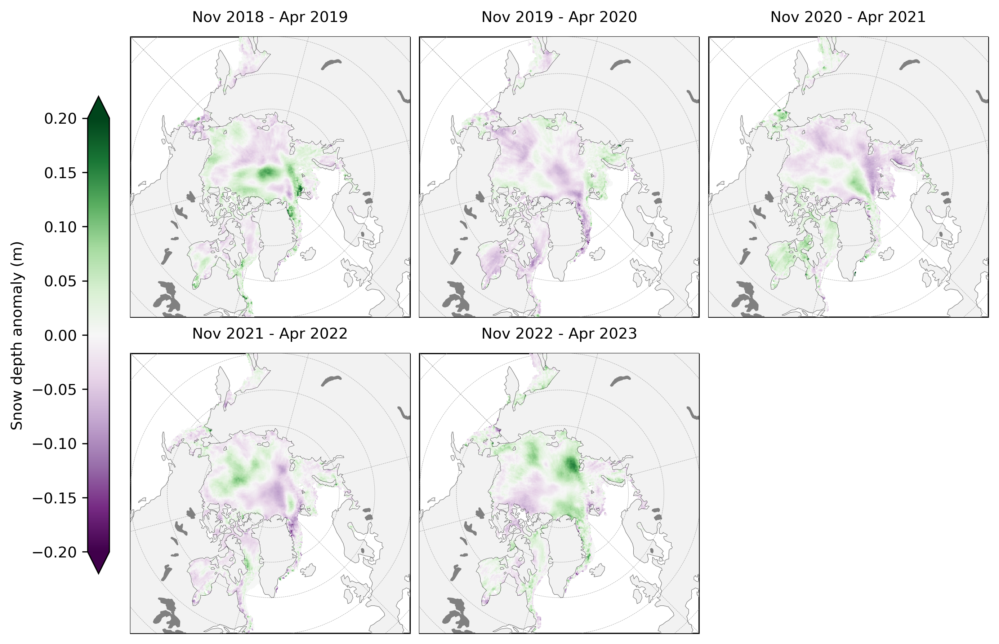

In [ ]:
snow_depth_winter_means = compute_gridcell_winter_means(IS2SITMOGR4_v3.snow_depth_int, years=years)
staticArcticMaps(snow_depth_winter_means-snow_depth_winter_means.mean(axis=0), dates=snow_depth_winter_means.time.values,col_wrap=3, set_cbarlabel = "Snow depth anomaly (m)", cmap="PRGn", vmin=-0.2, vmax=0.2, out_str='snowdepth_winter_anomaly_2018_2023')


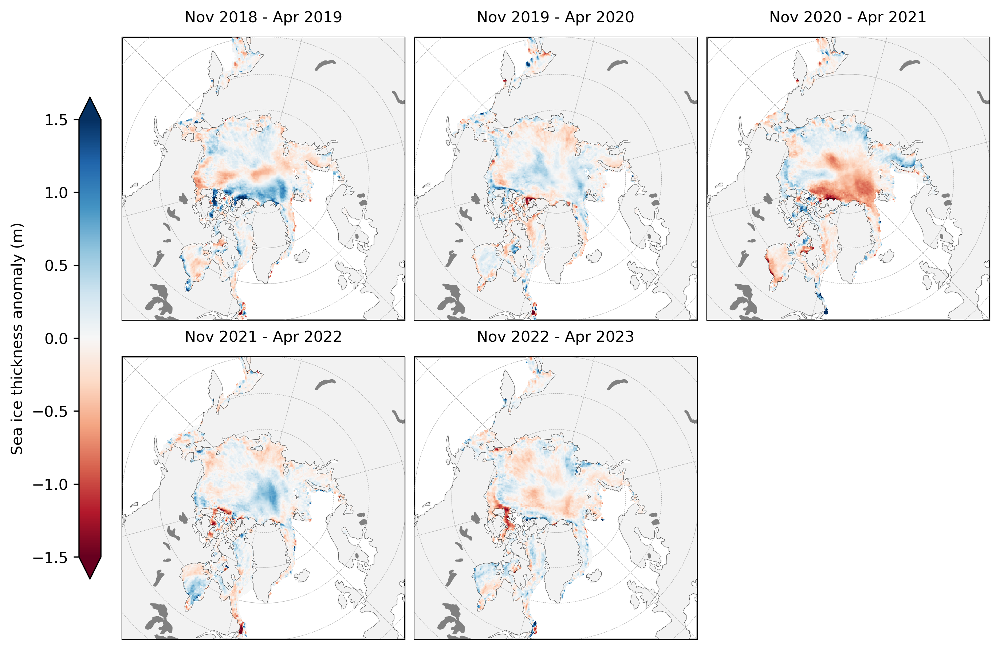

In [ ]:
thickness_winter_means = compute_gridcell_winter_means(IS2SITMOGR4_v3.ice_thickness_int, years=years)
staticArcticMaps(thickness_winter_means-thickness_winter_means.mean(axis=0), dates=thickness_winter_means.time.values,col_wrap=3, set_cbarlabel = "Sea ice thickness anomaly (m)", cmap="RdBu", vmin=-1.5, vmax=1.5, out_str='thickness_winter_anomaly_2018_2023')


## References

Jutila, A., Hendricks, S., Ricker, R., von Albedyll, L., Krumpen, T., and Haas, C. (2022). Retrieval and parameterisation of sea-ice bulk density from airborne multi-sensor measurements, The Cryosphere, 16, 259–275, https://doi.org/10.5194/tc-16-259-2022.

Landy, J.C., Dawson, G.J., Tsamados, M. et al. A year-round satellite sea-ice thickness record from CryoSat-2. Nature 609, 517–522 (2022). https://doi.org/10.1038/s41586-022-05058-5

Liston, G. E., J. Stroeve, and P. Itkin. (2021). Lagrangian Snow Distributions for Sea-Ice Applications, Version 1 [Data Set]. Boulder, Colorado USA. NASA National Snow and Ice Data Center Distributed Active Archive Center. https://doi.org/10.5067/27A0P5M6LZBI.

Petty, A. A., Keeney, N., Cabaj, A., Kushner, P., & Bagnardi, M. (2023). Winter Arctic sea ice thickness from ICESat-2: upgrades to freeboard and snow loading estimates and an assessment of the first three winters of data collection. The Cryosphere,17, 127–156, https://doi.org/10.5194/tc-17-127-2023

Petty, A. A., Kurtz, N. T., Kwok, R., Markus, T., & Neumann, T. A. (2020). Winter Arctic sea ice thickness from ICESat‐2 freeboards. Journal of Geophysical Research: Oceans, 125(5), e2019JC015764. https://doi.org/10.1029/2019JC015764

Tilling, R. L., A. Ridout, and A. Shepherd, (2017). Estimating Arctic sea ice thickness and volume using CryoSat-2 radar altimeter data, Advances in Space Research, 0273-1177, https://doi.org/10.1016/j.asr.2017.10.051.

Warren, S. G., Rigor, I. G., Untersteiner, N., Radionov, V. F., Bryazgin, N. N., Aleksandrov, Y. I., and Colony, R., (1999). Snow Depth on Arctic Sea Ice, Journal of Climate, 12, 1814–1829, https://doi.org/10.1175/1520-0442(1999)012<1814:SDOASI>2.0.CO;2.

    